# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn((n_samples, z_dim), device = device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [8]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [10]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [15]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise_vector = get_noise(num_images, z_dim, device)
    fake_images = gen(noise_vector)
    descr_pred_fake = disc(fake_images.detach())
    ground_truth_zero = torch.zeros((num_images,1), device = device)
    loss_fake = criterion(descr_pred_fake, ground_truth_zero)
    descr_pred_real = disc(real)
    ground_truth_one = torch.ones((num_images,1), device = device)
    loss_real = criterion(descr_pred_real, ground_truth_one)
    disc_loss = (loss_real + loss_fake)/2
    #### END CODE HERE ####
    return disc_loss

In [16]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [17]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_vector = get_noise(num_images, z_dim, device)
    fake_images = gen(noise_vector)
    descr_pred_fake = disc(fake_images)
    ground_truth_one = torch.ones((num_images,1), device = device)
    gen_loss = criterion(descr_pred_fake, ground_truth_one)
    #### END CODE HERE ####
    return gen_loss

In [18]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.3912148282527916, discriminator loss: 0.4159762713313104


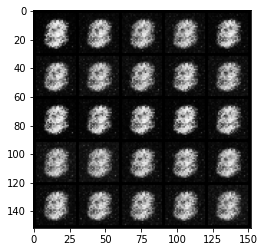

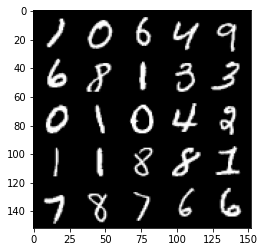

Step 1000: Generator loss: 1.7861363880634331, discriminator loss: 0.2680885189175606


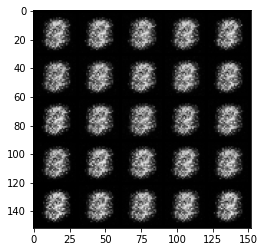

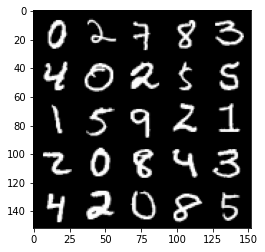

Step 1500: Generator loss: 2.1802649435997004, discriminator loss: 0.13230501481890686


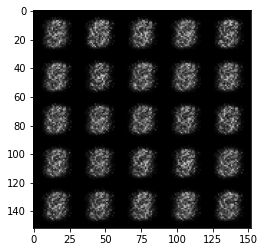

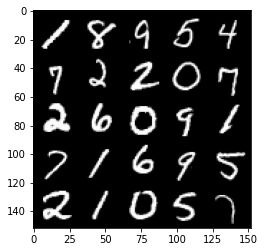

Step 2000: Generator loss: 1.9368631122112283, discriminator loss: 0.15241226747632014


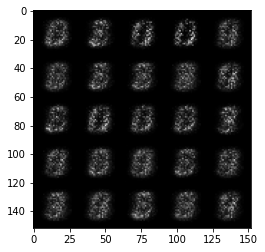

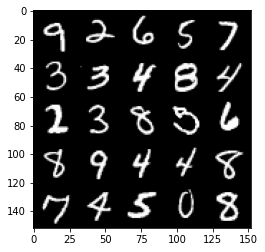

Step 2500: Generator loss: 1.8426780920028683, discriminator loss: 0.16948671823740008


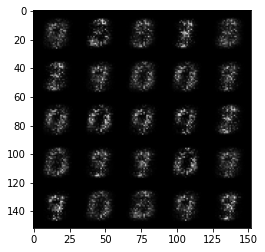

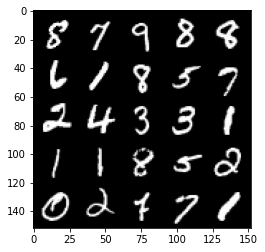

Step 3000: Generator loss: 2.2437056128978763, discriminator loss: 0.11386378946900366


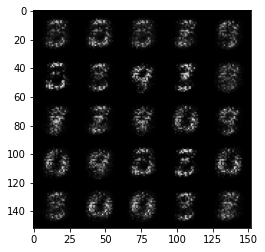

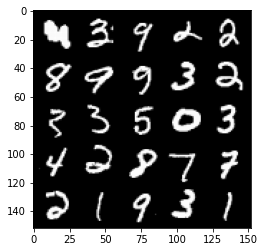

Step 3500: Generator loss: 2.694076725959779, discriminator loss: 0.09567416680604224


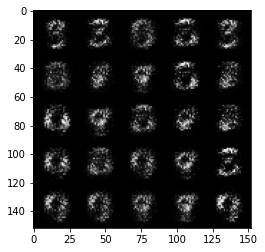

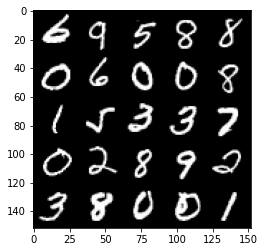

Step 4000: Generator loss: 3.053797578811645, discriminator loss: 0.09203478704392905


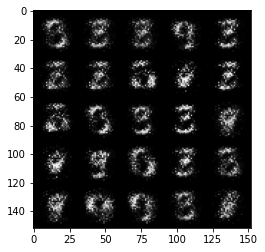

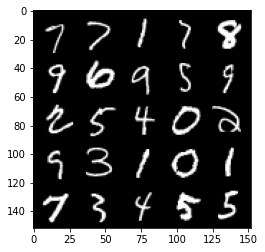

Step 4500: Generator loss: 3.501847176074982, discriminator loss: 0.0704322173446417


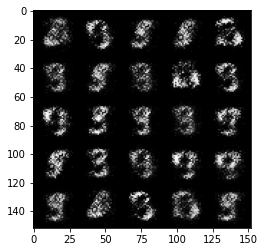

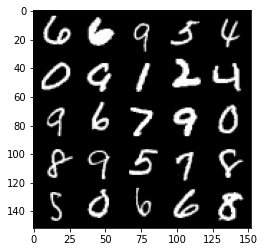

Step 5000: Generator loss: 3.9763998894691466, discriminator loss: 0.05933367263898256


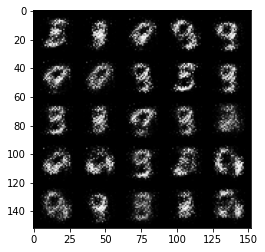

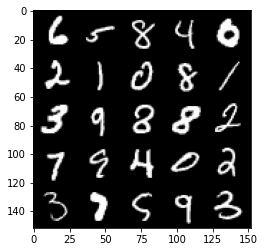

Step 5500: Generator loss: 4.0144403147697405, discriminator loss: 0.05472265752032397


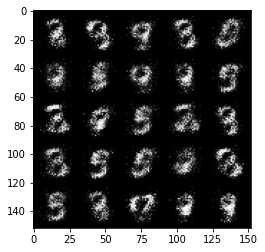

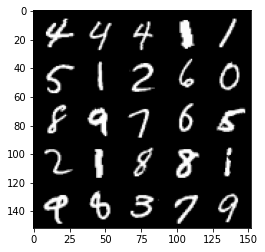

Step 6000: Generator loss: 4.190568382740015, discriminator loss: 0.046652301341295235


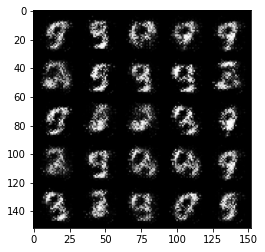

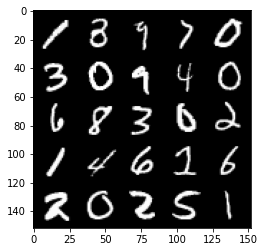

Step 6500: Generator loss: 4.642345438480375, discriminator loss: 0.03487404908239844


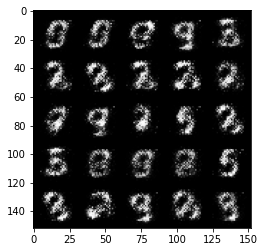

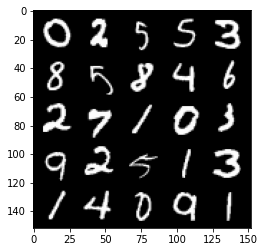

Step 7000: Generator loss: 4.6798129105567945, discriminator loss: 0.03238007030822337


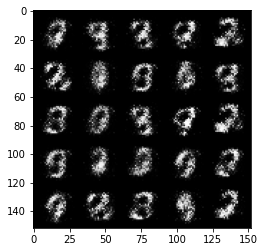

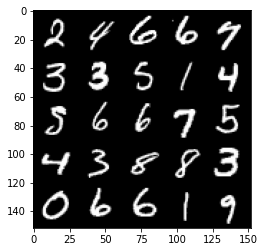

Step 7500: Generator loss: 4.813781731128692, discriminator loss: 0.032269611166790134


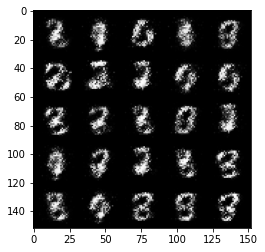

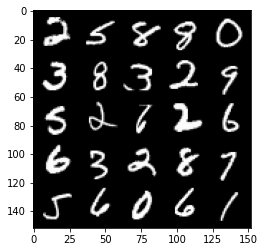

Step 8000: Generator loss: 4.607614420890808, discriminator loss: 0.035119749454781406


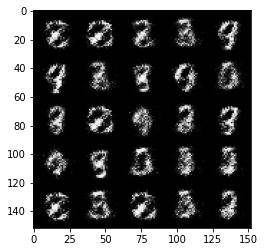

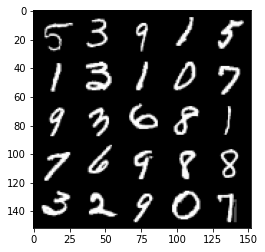

Step 8500: Generator loss: 4.9376786069869985, discriminator loss: 0.03277393050119282


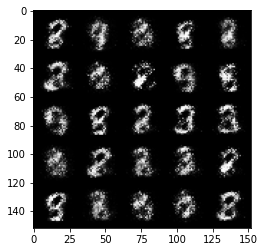

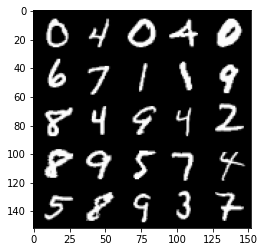

Step 9000: Generator loss: 5.021921560287475, discriminator loss: 0.032120098629966384


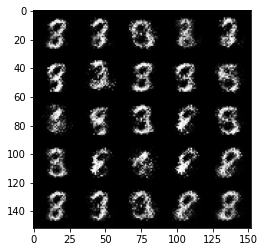

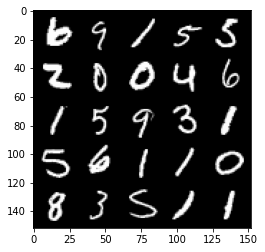

Step 9500: Generator loss: 4.9765545563697895, discriminator loss: 0.03183226599544286


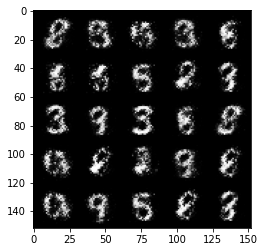

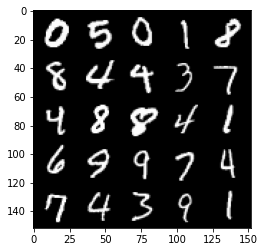

Step 10000: Generator loss: 4.995993186950684, discriminator loss: 0.03528357656486329


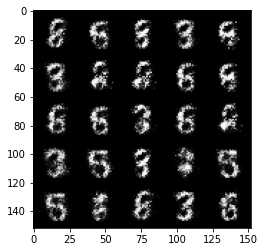

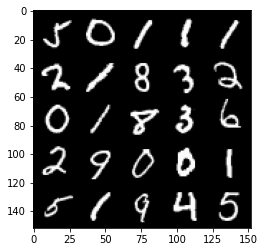

Step 10500: Generator loss: 4.89967542266846, discriminator loss: 0.035547530185431254


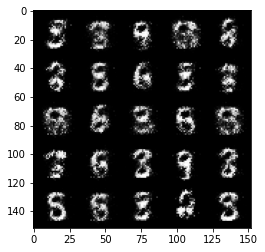

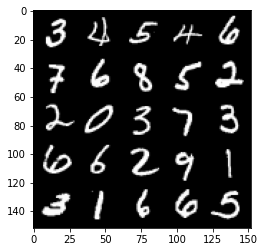

Step 11000: Generator loss: 4.899652522563938, discriminator loss: 0.03895644287392493


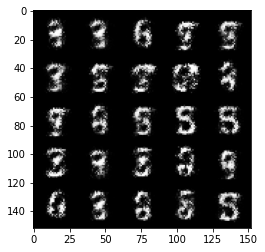

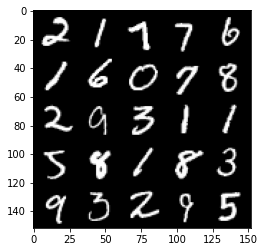

Step 11500: Generator loss: 4.994098801136012, discriminator loss: 0.0380247438214719


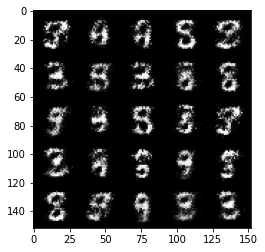

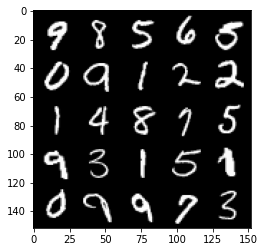

Step 12000: Generator loss: 5.015142186641687, discriminator loss: 0.04016904867999258


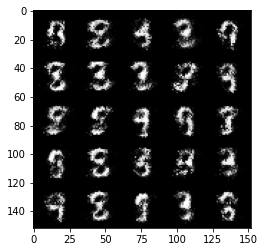

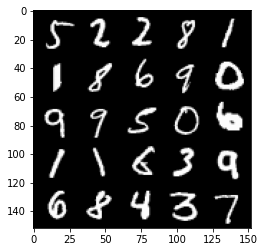

Step 12500: Generator loss: 4.939708116054534, discriminator loss: 0.04188313193805515


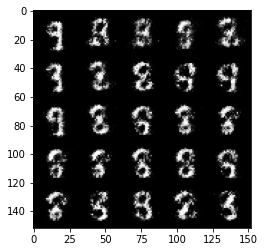

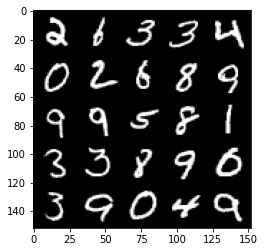

Step 13000: Generator loss: 5.090956433296203, discriminator loss: 0.035359276510775035


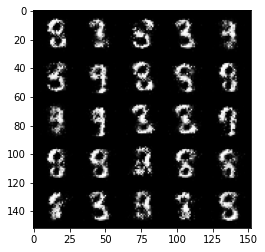

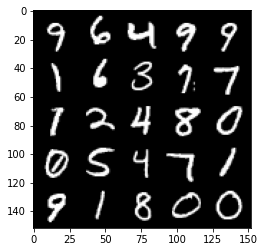

Step 13500: Generator loss: 4.945265222072606, discriminator loss: 0.037675487138330944


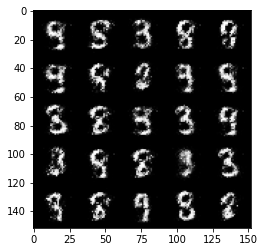

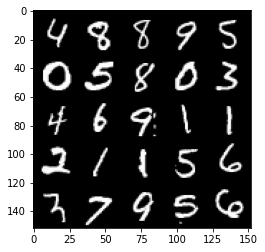

Step 14000: Generator loss: 4.885843031406405, discriminator loss: 0.039687784615904095


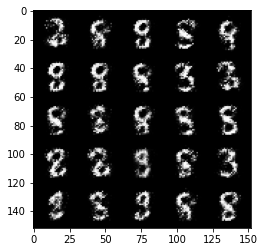

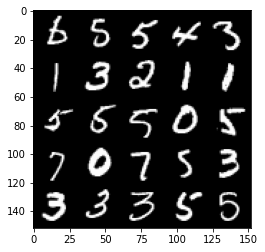

Step 14500: Generator loss: 5.104199954032898, discriminator loss: 0.04275272629596293


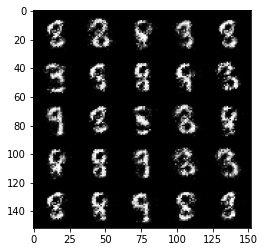

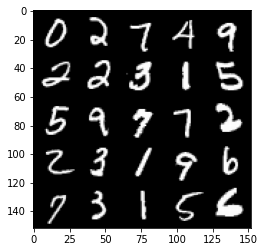

Step 15000: Generator loss: 5.090157588005072, discriminator loss: 0.049962354384362695


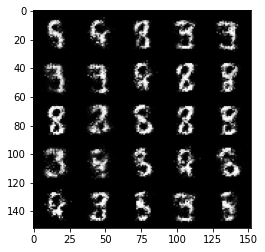

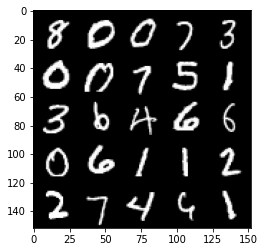

Step 15500: Generator loss: 4.990532109260562, discriminator loss: 0.059853360995650286


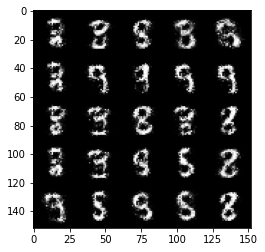

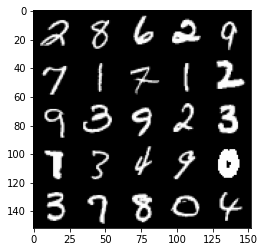

Step 16000: Generator loss: 4.907194872379305, discriminator loss: 0.05981794236972926


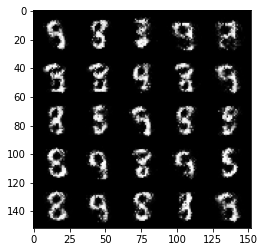

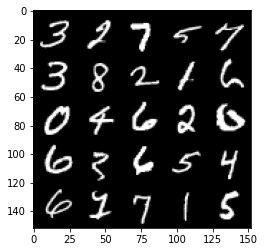

Step 16500: Generator loss: 4.612219536781313, discriminator loss: 0.06011124769598242


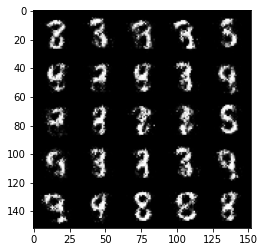

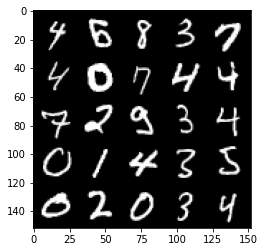

Step 17000: Generator loss: 4.759010621547697, discriminator loss: 0.0617685468867421


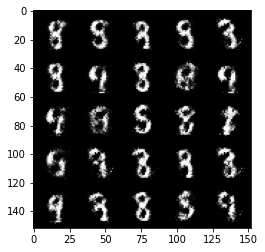

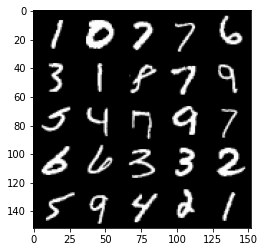

Step 17500: Generator loss: 4.845828325748445, discriminator loss: 0.061189388599246844


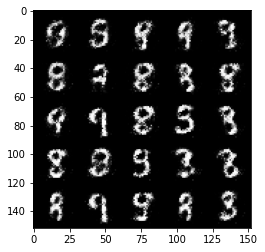

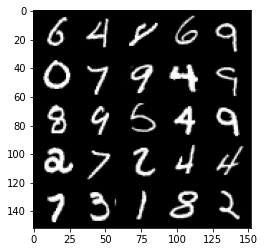

Step 18000: Generator loss: 4.6950800318717905, discriminator loss: 0.06192383026331663


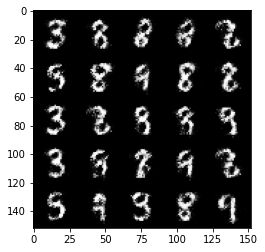

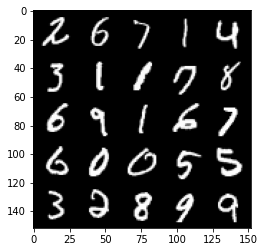

Step 18500: Generator loss: 4.862683907508846, discriminator loss: 0.05643262665718795


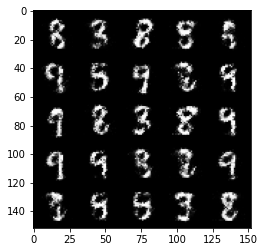

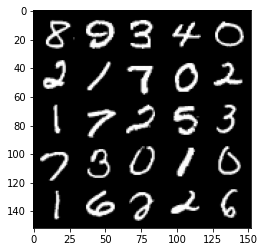

Step 19000: Generator loss: 4.789257893085485, discriminator loss: 0.06031184843927622


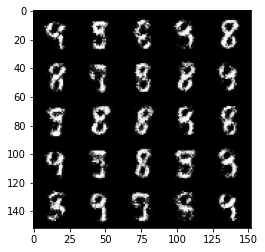

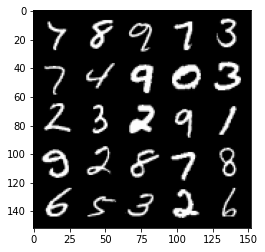

Step 19500: Generator loss: 4.7740368704795815, discriminator loss: 0.0720763135403395


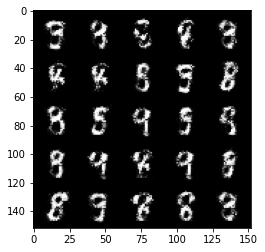

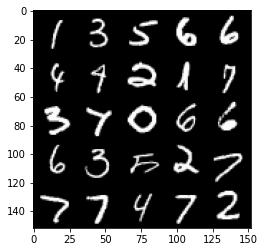

Step 20000: Generator loss: 4.544754372119904, discriminator loss: 0.07525630578026175


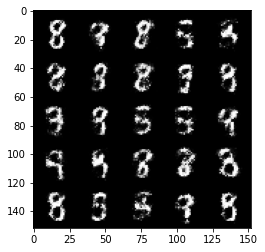

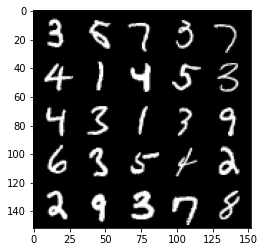

Step 20500: Generator loss: 4.458691839218146, discriminator loss: 0.08594573185592898


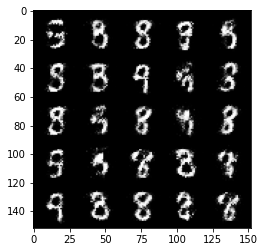

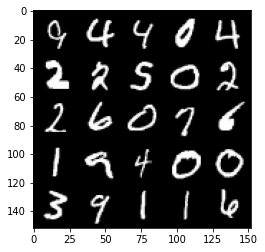

Step 21000: Generator loss: 4.327612185478208, discriminator loss: 0.0784038675241173


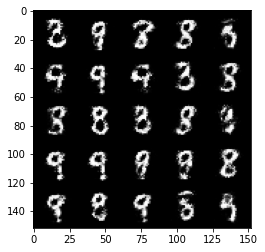

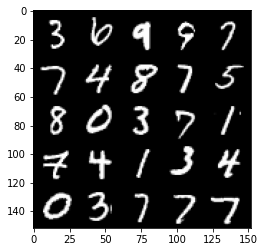

Step 21500: Generator loss: 4.211972055435185, discriminator loss: 0.08076453065127136


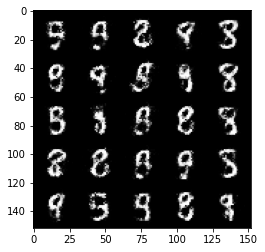

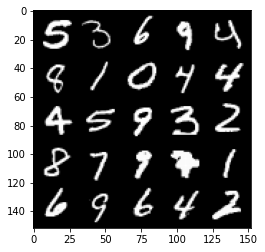

Step 22000: Generator loss: 4.243704890727996, discriminator loss: 0.08933197771012778


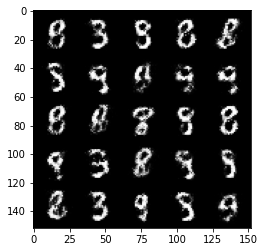

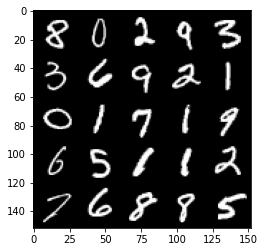

Step 22500: Generator loss: 4.322630867004394, discriminator loss: 0.08618218433856963


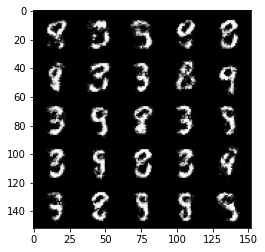

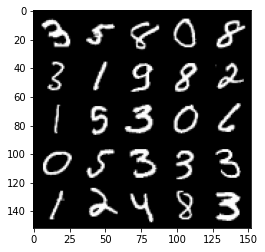

Step 23000: Generator loss: 4.201134943008423, discriminator loss: 0.08808389336615786


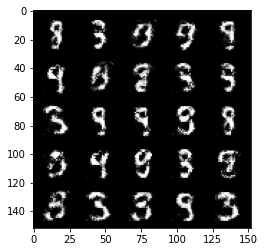

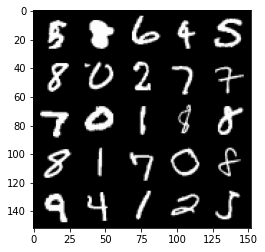

Step 23500: Generator loss: 4.133545229434966, discriminator loss: 0.09878407730907211


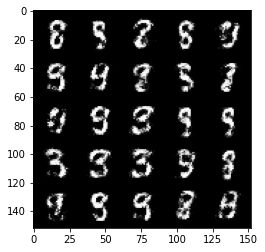

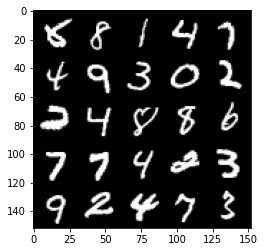

Step 24000: Generator loss: 4.040856271743774, discriminator loss: 0.10477336944639687


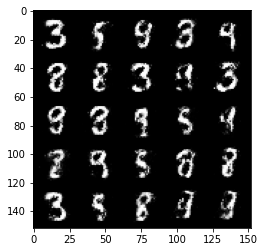

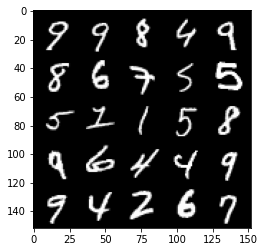

Step 24500: Generator loss: 3.92014164352417, discriminator loss: 0.1083837512955069


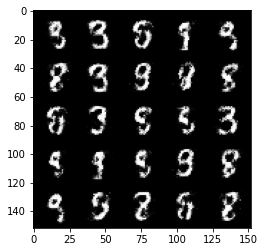

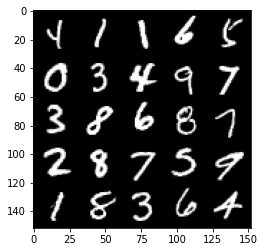

Step 25000: Generator loss: 4.141038634300228, discriminator loss: 0.09735415687412026


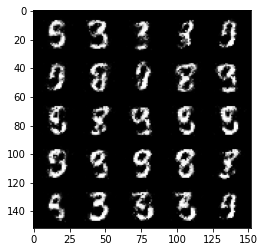

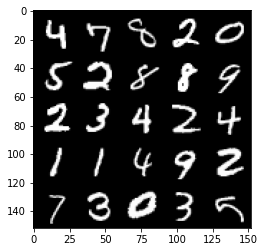

Step 25500: Generator loss: 4.079664789676665, discriminator loss: 0.10425710901617997


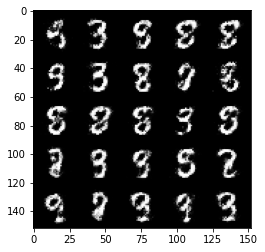

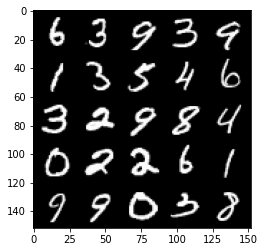

Step 26000: Generator loss: 3.9263053312301666, discriminator loss: 0.11817650559544571


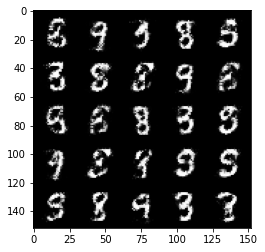

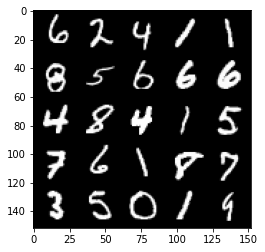

Step 26500: Generator loss: 4.029039897918704, discriminator loss: 0.1020672586560249


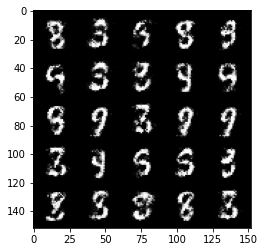

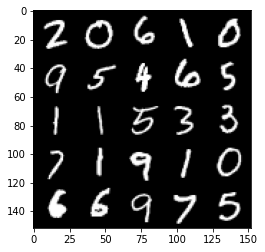

Step 27000: Generator loss: 3.9886800174713177, discriminator loss: 0.1077353965267539


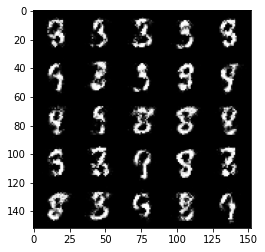

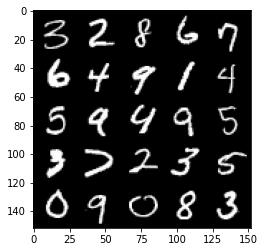

Step 27500: Generator loss: 3.900235220432282, discriminator loss: 0.11954880193620922


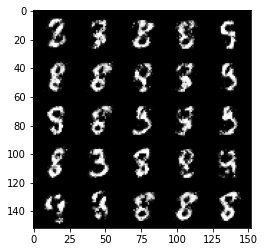

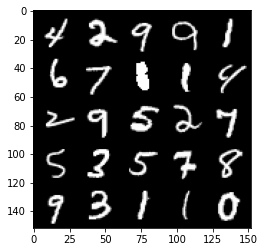

Step 28000: Generator loss: 3.8163784584999085, discriminator loss: 0.12091694777458911


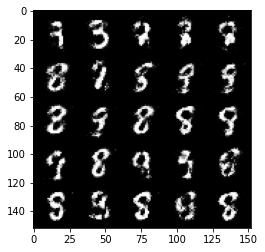

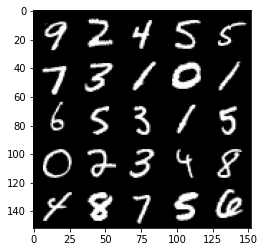

Step 28500: Generator loss: 3.7321555504798885, discriminator loss: 0.12736949865520003


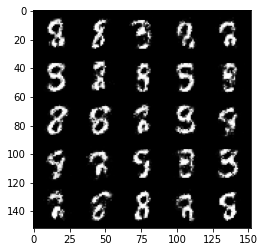

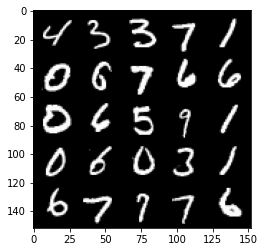

Step 29000: Generator loss: 3.6467568902969356, discriminator loss: 0.14322023618966348


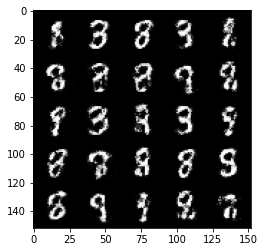

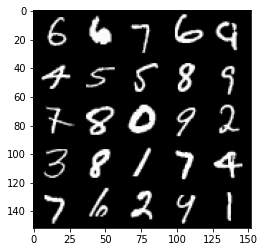

Step 29500: Generator loss: 3.6816555809974645, discriminator loss: 0.13184388138353817


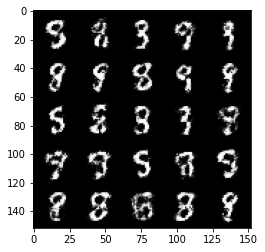

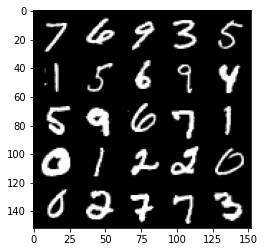

Step 30000: Generator loss: 3.753607769012453, discriminator loss: 0.1392790629863739


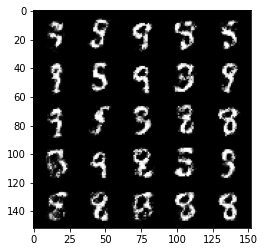

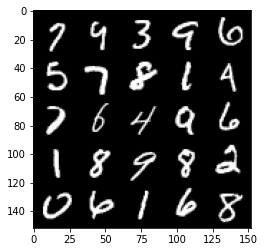

Step 30500: Generator loss: 3.5791890978813177, discriminator loss: 0.1535340954214335


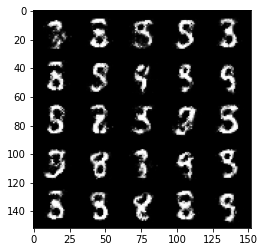

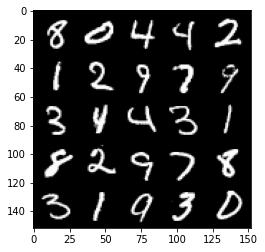

Step 31000: Generator loss: 3.3905173125267036, discriminator loss: 0.1640038168728351


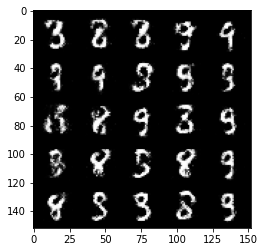

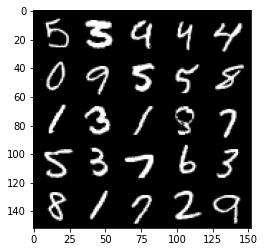

Step 31500: Generator loss: 3.4774174094200148, discriminator loss: 0.15781285767257214


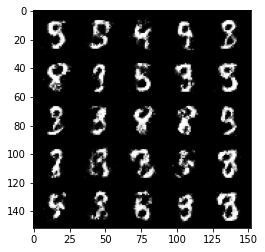

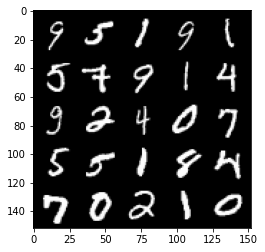

Step 32000: Generator loss: 3.4455840225219725, discriminator loss: 0.1666183796525003


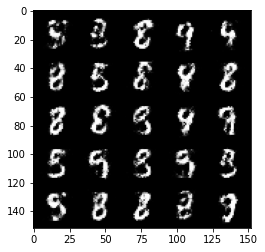

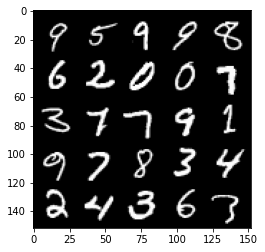

Step 32500: Generator loss: 3.313271272659303, discriminator loss: 0.17395185467600818


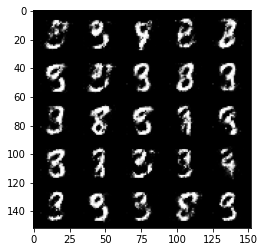

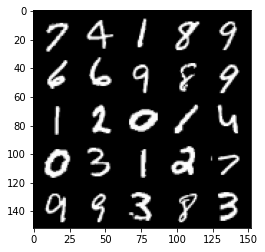

Step 33000: Generator loss: 3.3683967714309704, discriminator loss: 0.17588833746314056


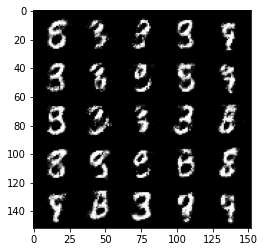

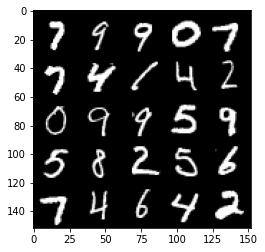

Step 33500: Generator loss: 3.177324519157411, discriminator loss: 0.1806261646151543


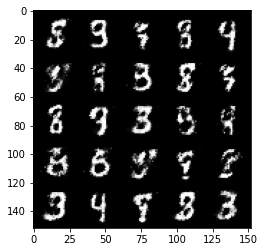

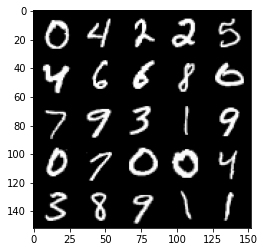

Step 34000: Generator loss: 3.200407737255099, discriminator loss: 0.1766973171979188


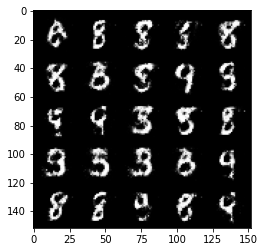

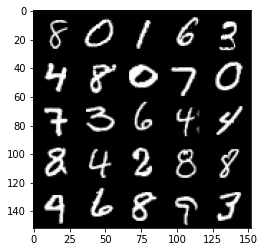

Step 34500: Generator loss: 3.0790686454772964, discriminator loss: 0.1847921306043863


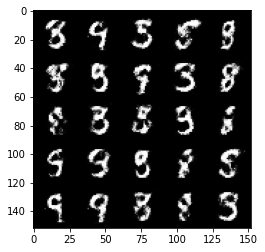

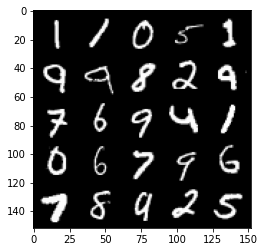

Step 35000: Generator loss: 3.1383160920143176, discriminator loss: 0.18414197877049435


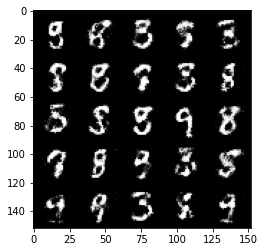

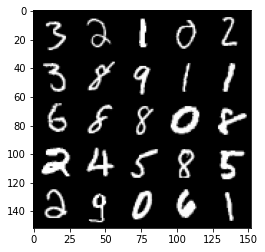

Step 35500: Generator loss: 3.154720902919768, discriminator loss: 0.17582122707366943


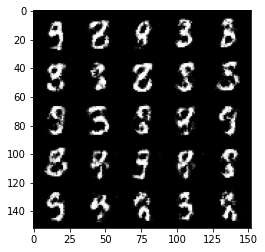

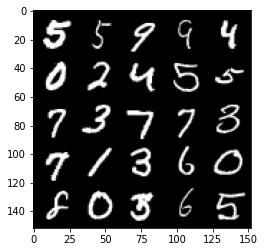

Step 36000: Generator loss: 3.239428480625152, discriminator loss: 0.17034857942163947


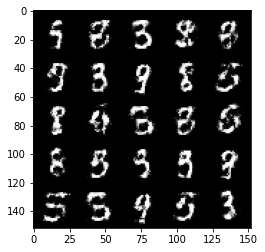

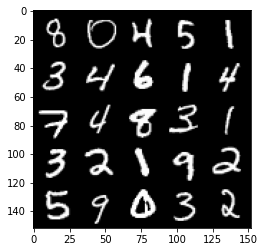

Step 36500: Generator loss: 3.2415347881317134, discriminator loss: 0.18303414657711967


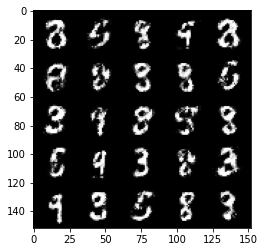

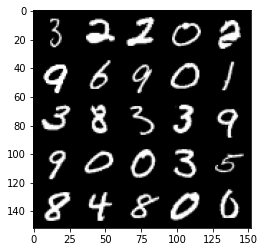

Step 37000: Generator loss: 3.1045343351364107, discriminator loss: 0.19826706375181674


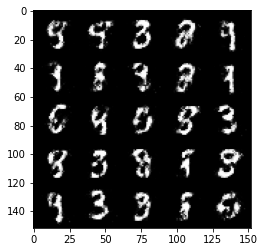

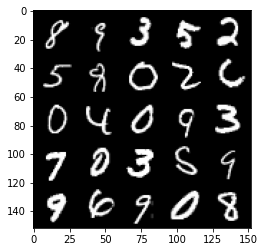

Step 37500: Generator loss: 3.06520767402649, discriminator loss: 0.1992807225883006


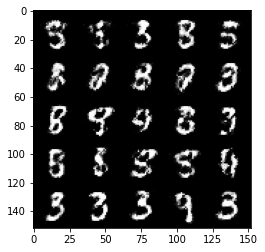

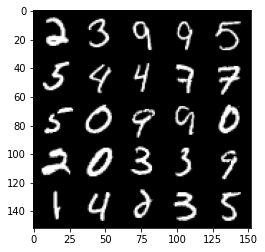

Step 38000: Generator loss: 3.0520198502540605, discriminator loss: 0.1989634410440922


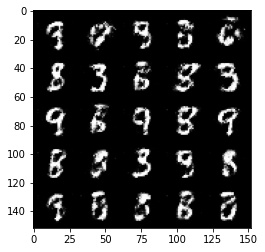

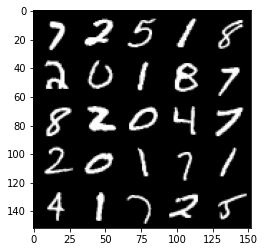

Step 38500: Generator loss: 3.0771335148811336, discriminator loss: 0.18789933694899072


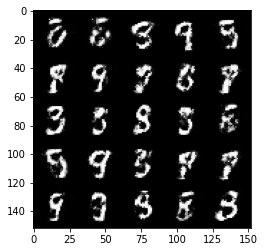

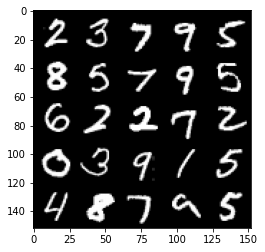

Step 39000: Generator loss: 2.9473593068122876, discriminator loss: 0.20193078814446933


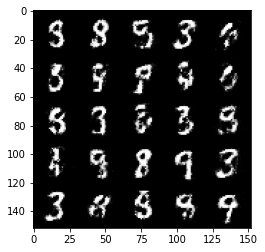

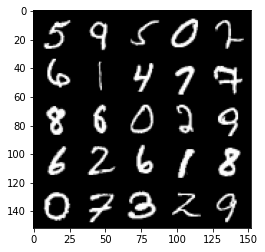

Step 39500: Generator loss: 2.956790751934051, discriminator loss: 0.1945381192713976


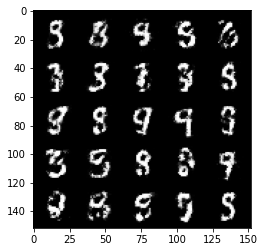

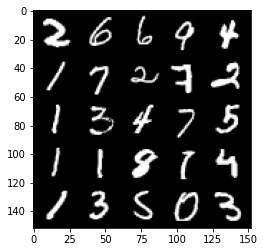

Step 40000: Generator loss: 3.042219930171965, discriminator loss: 0.18549107314646238


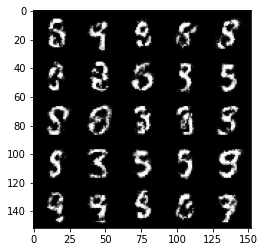

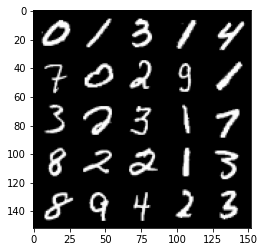

Step 40500: Generator loss: 3.024730332851408, discriminator loss: 0.19593001452088363


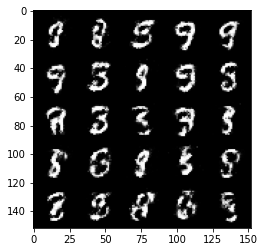

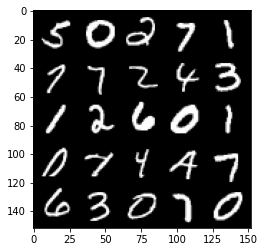

Step 41000: Generator loss: 3.0370924816131604, discriminator loss: 0.18293470966815945


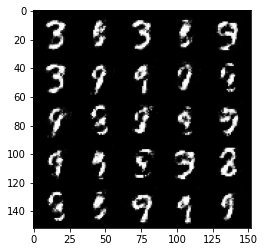

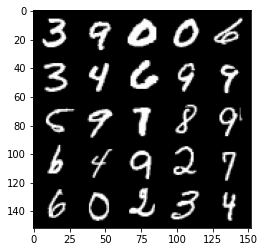

Step 41500: Generator loss: 2.885893867492675, discriminator loss: 0.2045442044436931


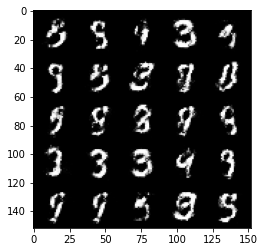

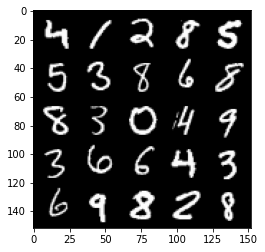

Step 42000: Generator loss: 2.7798741927146913, discriminator loss: 0.219405117124319


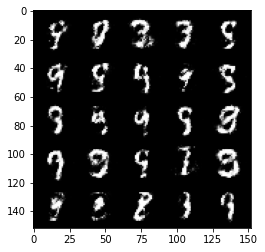

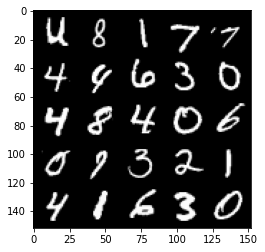

Step 42500: Generator loss: 2.830193472862242, discriminator loss: 0.20190890908241282


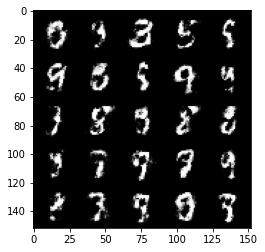

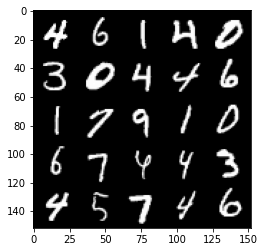

Step 43000: Generator loss: 2.9062141804695134, discriminator loss: 0.19338816003501416


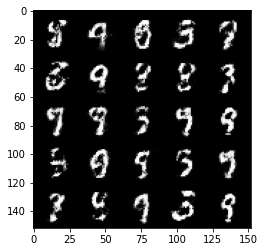

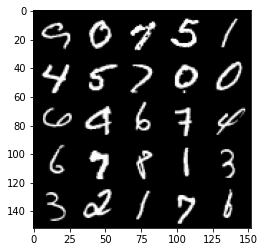

Step 43500: Generator loss: 2.866259994983673, discriminator loss: 0.20158766670525083


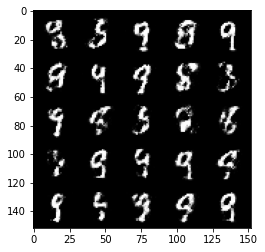

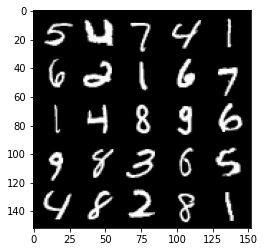

Step 44000: Generator loss: 2.9054232797622688, discriminator loss: 0.19980800485610958


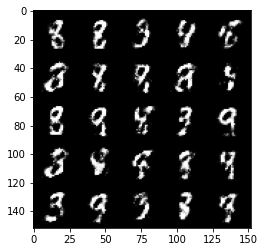

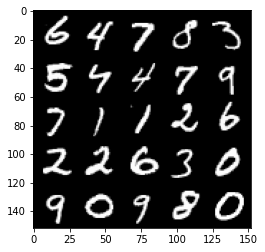

Step 44500: Generator loss: 2.9066714150905595, discriminator loss: 0.19620919758081448


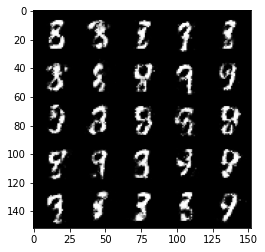

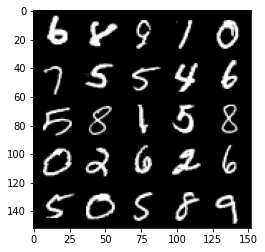

Step 45000: Generator loss: 2.908730313539505, discriminator loss: 0.20640851613879194


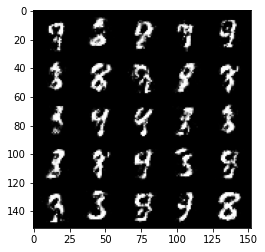

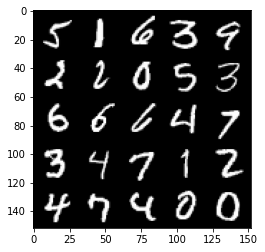

Step 45500: Generator loss: 2.767050336599352, discriminator loss: 0.222605893343687


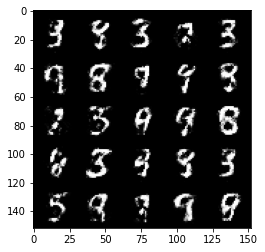

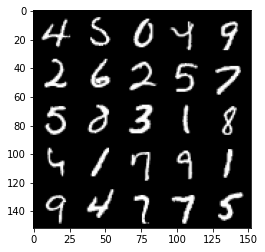

Step 46000: Generator loss: 2.7779181647300706, discriminator loss: 0.22749401101470004


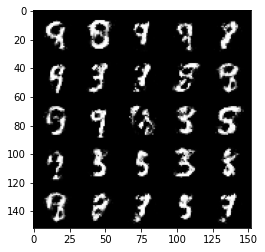

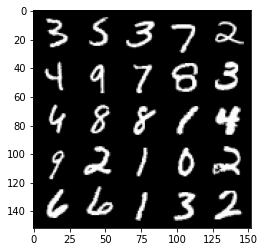

Step 46500: Generator loss: 2.6900088489055642, discriminator loss: 0.2215297889113428


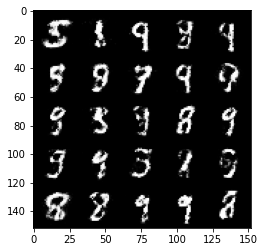

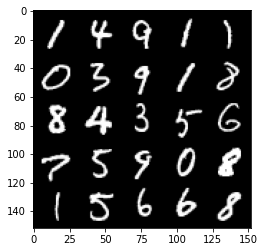

Step 47000: Generator loss: 2.6943383119106272, discriminator loss: 0.21501080468297004


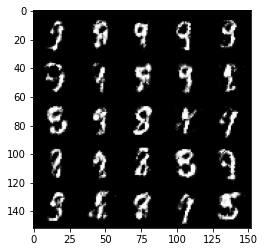

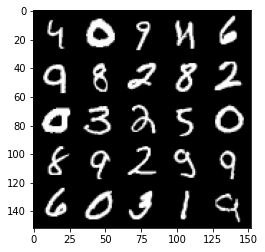

Step 47500: Generator loss: 2.7455737175941497, discriminator loss: 0.20433490303158772


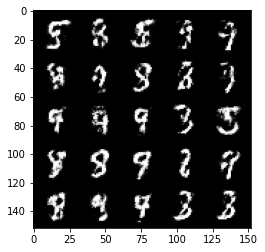

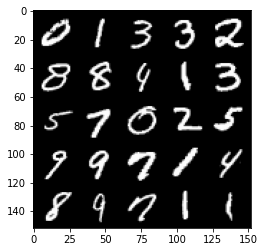

Step 48000: Generator loss: 2.843059586524962, discriminator loss: 0.20092598825693136


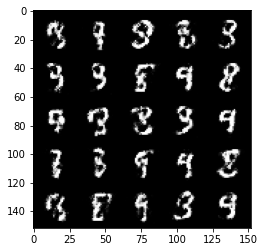

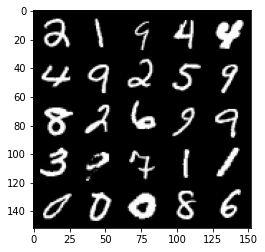

Step 48500: Generator loss: 2.7124032673835763, discriminator loss: 0.22357076442241655


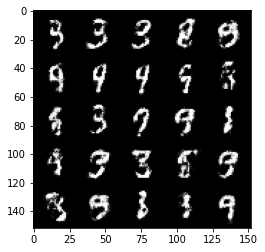

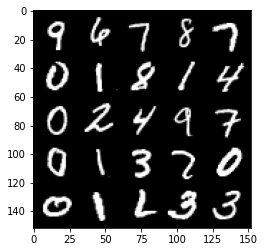

Step 49000: Generator loss: 2.6390293686389947, discriminator loss: 0.2212895101010799


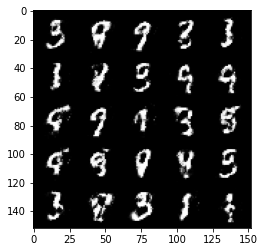

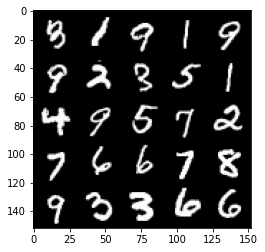

Step 49500: Generator loss: 2.675653351306917, discriminator loss: 0.21702776429057105


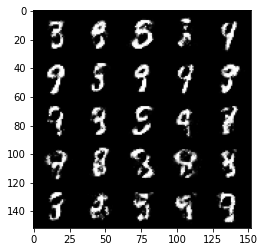

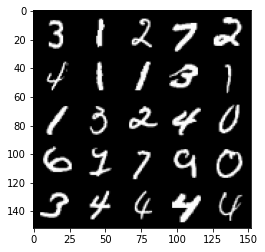

Step 50000: Generator loss: 2.5072864444255853, discriminator loss: 0.24848439624905577


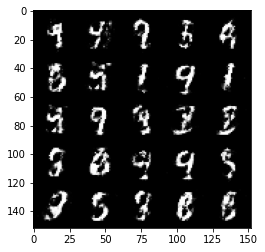

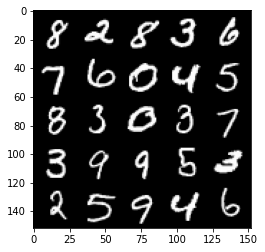

Step 50500: Generator loss: 2.505833647966383, discriminator loss: 0.23351191532611865


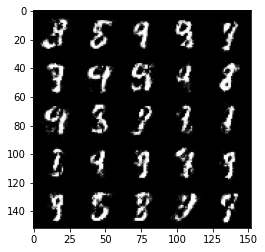

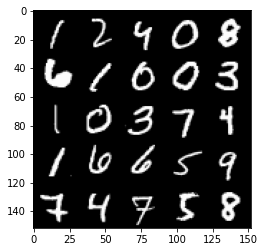

Step 51000: Generator loss: 2.5536758091449747, discriminator loss: 0.2363401049971582


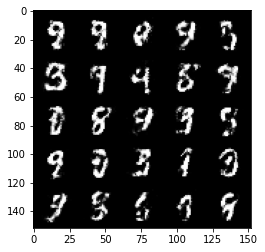

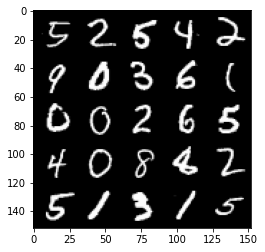

Step 51500: Generator loss: 2.596610492944719, discriminator loss: 0.2279870251715183


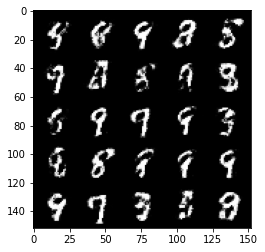

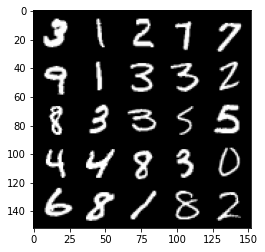

Step 52000: Generator loss: 2.477962508916855, discriminator loss: 0.2547628154754638


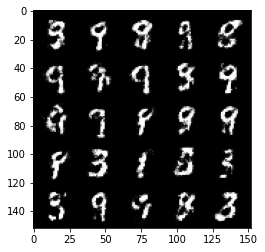

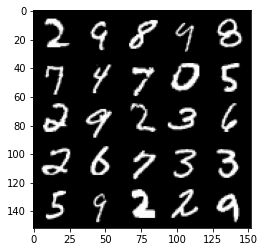

Step 52500: Generator loss: 2.4757742185592653, discriminator loss: 0.24310344862937935


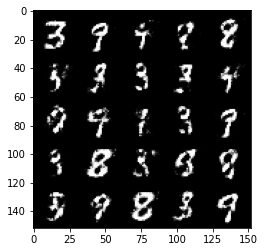

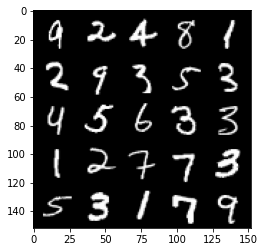

Step 53000: Generator loss: 2.526309591054916, discriminator loss: 0.2394502185583113


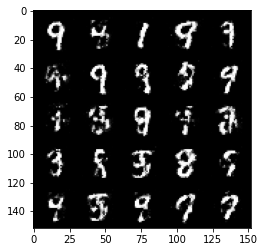

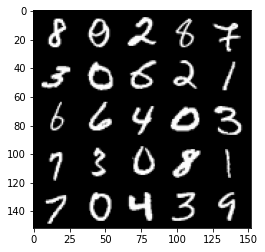

Step 53500: Generator loss: 2.5111605722904176, discriminator loss: 0.2617408320009707


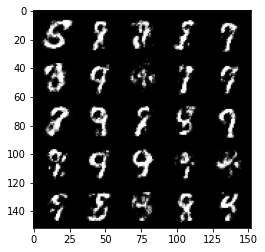

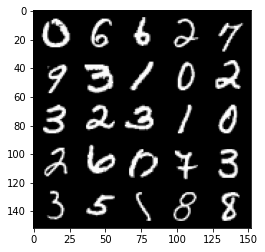

Step 54000: Generator loss: 2.431269039154051, discriminator loss: 0.2531920963823794


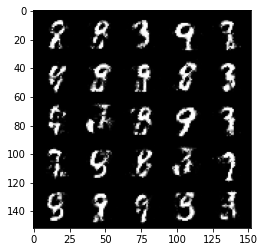

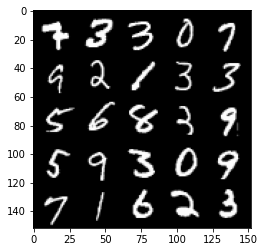

Step 54500: Generator loss: 2.485099170446395, discriminator loss: 0.23660885497927667


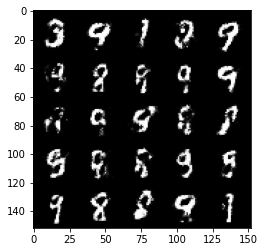

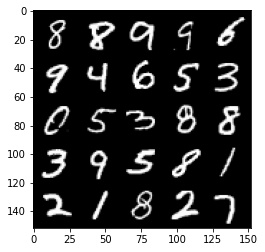

Step 55000: Generator loss: 2.4530025722980486, discriminator loss: 0.24561236608028417


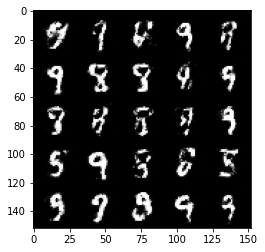

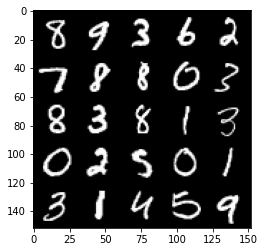

Step 55500: Generator loss: 2.446436807394027, discriminator loss: 0.25947311818599705


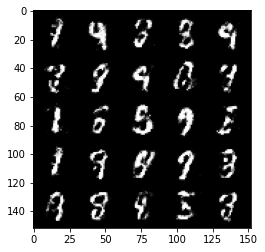

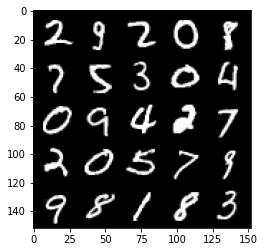

Step 56000: Generator loss: 2.528820918083192, discriminator loss: 0.24457894191145904


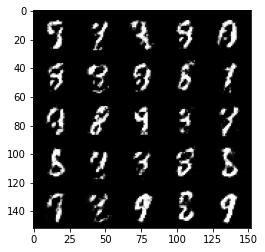

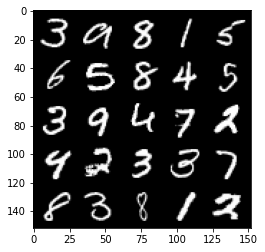

Step 56500: Generator loss: 2.5531910543441776, discriminator loss: 0.24632042250037176


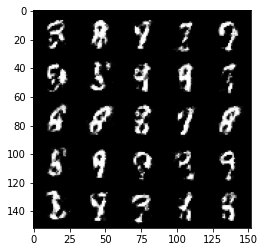

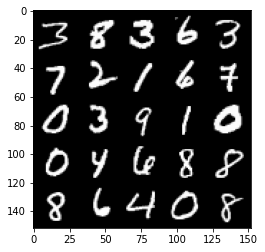

Step 57000: Generator loss: 2.441007162809371, discriminator loss: 0.2698721934258937


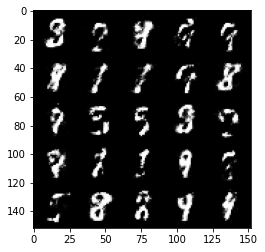

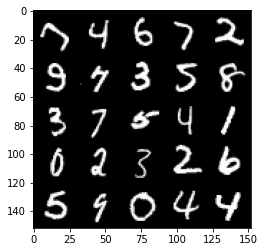

Step 57500: Generator loss: 2.4207383966445946, discriminator loss: 0.2576530956923961


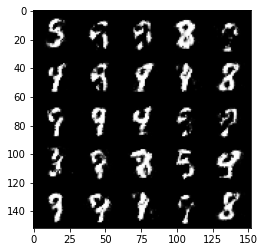

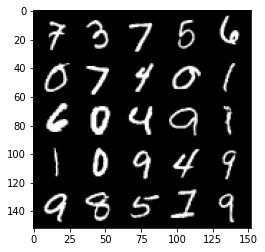

Step 58000: Generator loss: 2.3132098572254205, discriminator loss: 0.27771934118866903


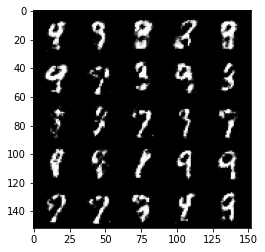

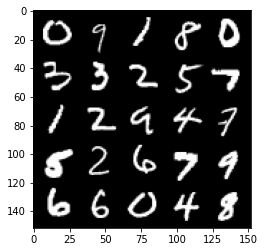

Step 58500: Generator loss: 2.315734054803848, discriminator loss: 0.26914405220746973


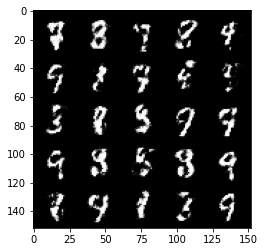

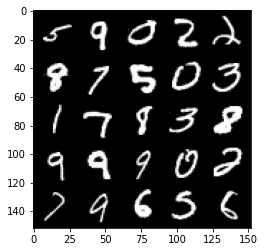

Step 59000: Generator loss: 2.4626705400943756, discriminator loss: 0.2408602927029132


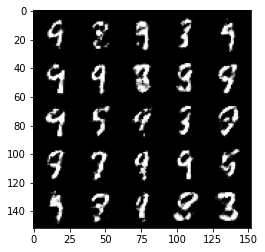

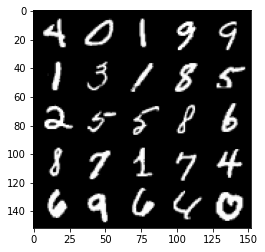

Step 59500: Generator loss: 2.487684777021408, discriminator loss: 0.2358224304914475


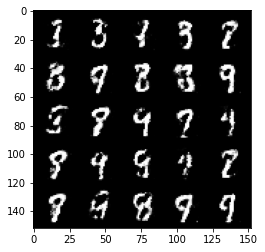

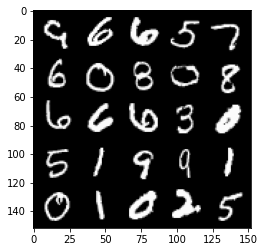

Step 60000: Generator loss: 2.3400856912136088, discriminator loss: 0.26275229007005735


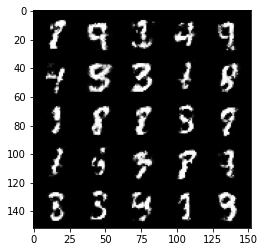

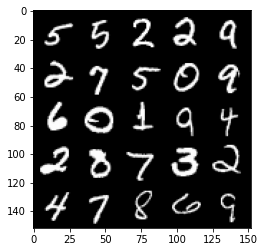

Step 60500: Generator loss: 2.2926318631172187, discriminator loss: 0.2676080815494062


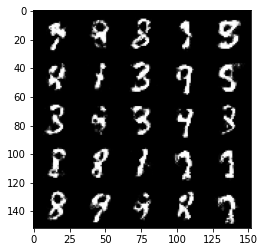

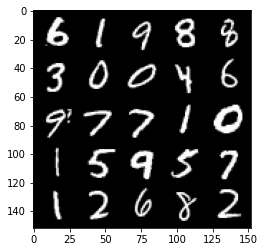

Step 61000: Generator loss: 2.332130047798157, discriminator loss: 0.2605417253077029


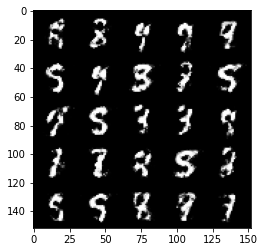

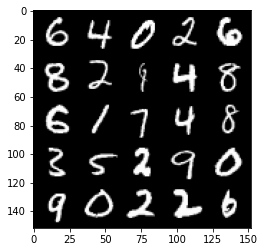

Step 61500: Generator loss: 2.3368873178958913, discriminator loss: 0.2669086256921289


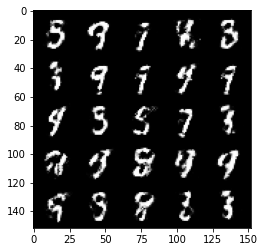

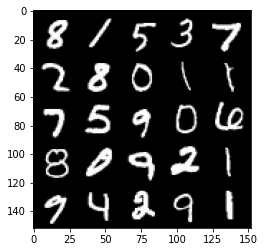

Step 62000: Generator loss: 2.2903176743984224, discriminator loss: 0.27393191456794713


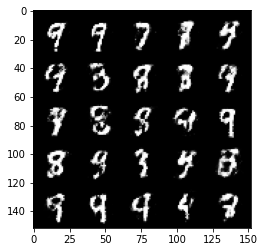

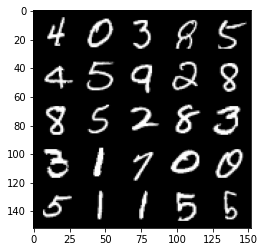

Step 62500: Generator loss: 2.245892550706862, discriminator loss: 0.2764928734898568


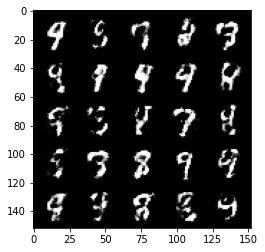

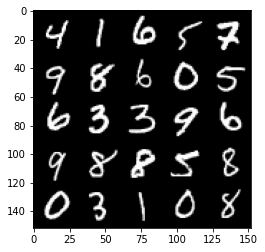

Step 63000: Generator loss: 2.307714941024782, discriminator loss: 0.25472882732748975


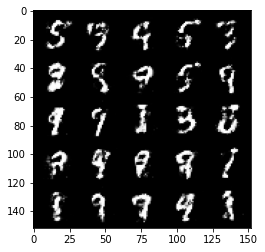

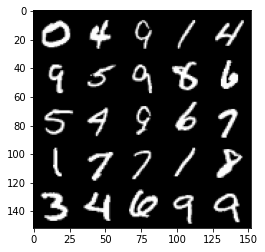

Step 63500: Generator loss: 2.338691268444058, discriminator loss: 0.2512034691572192


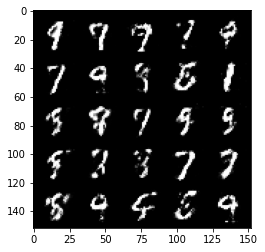

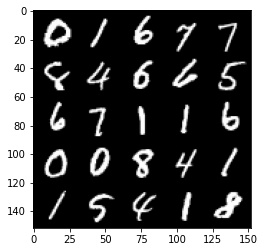

Step 64000: Generator loss: 2.2703916437625886, discriminator loss: 0.27479772183299056


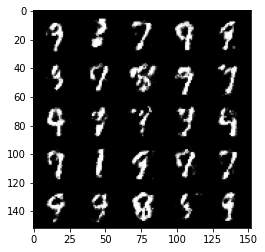

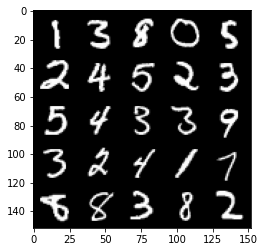

Step 64500: Generator loss: 2.2057998247146613, discriminator loss: 0.28463415521383273


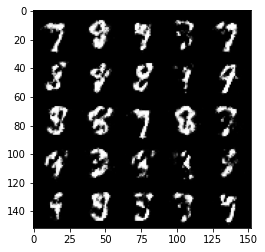

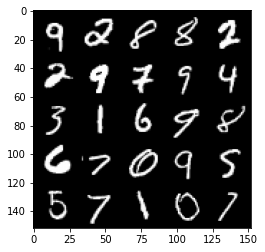

Step 65000: Generator loss: 2.1738384451866146, discriminator loss: 0.29604938301444056


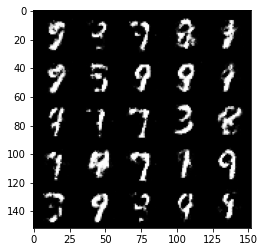

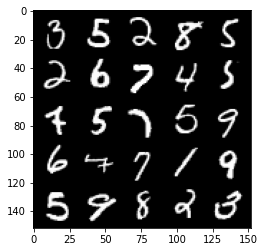

Step 65500: Generator loss: 2.235966785669326, discriminator loss: 0.2712420290708544


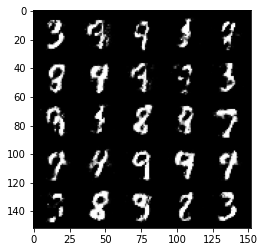

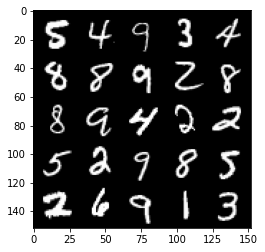

Step 66000: Generator loss: 2.1773074836730983, discriminator loss: 0.2932951926290988


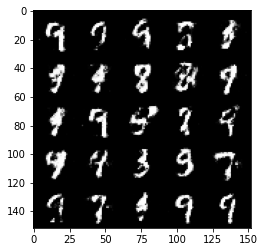

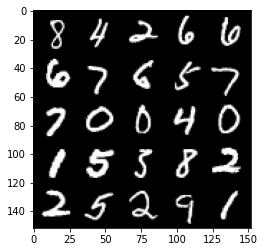

Step 66500: Generator loss: 2.2030561335086802, discriminator loss: 0.2798250607550147


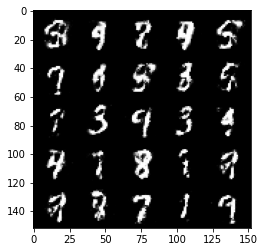

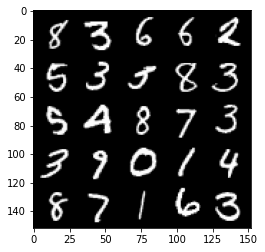

Step 67000: Generator loss: 2.190226033687593, discriminator loss: 0.2842254880964758


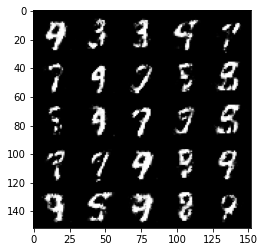

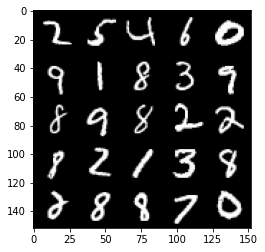

Step 67500: Generator loss: 2.161321136713027, discriminator loss: 0.28785679766535777


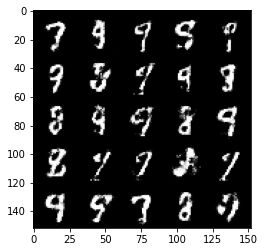

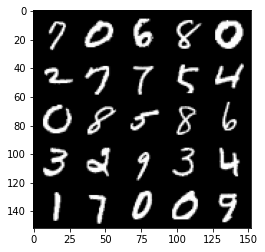

Step 68000: Generator loss: 2.2422418925762164, discriminator loss: 0.2681979121863842


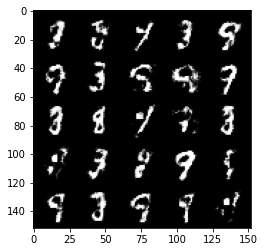

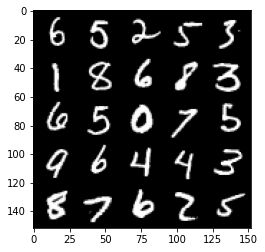

Step 68500: Generator loss: 2.259196541786193, discriminator loss: 0.26469084751605954


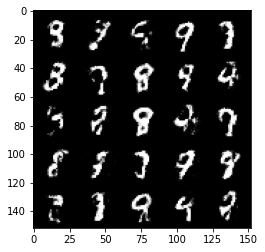

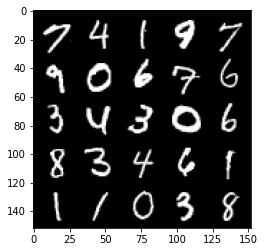

Step 69000: Generator loss: 2.2707671563625356, discriminator loss: 0.2558551582992077


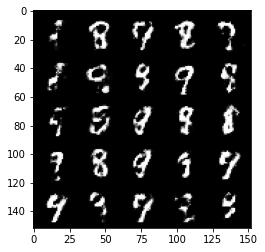

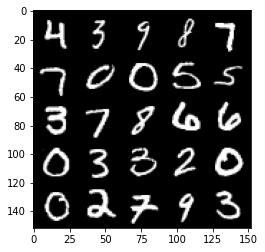

Step 69500: Generator loss: 2.284943145275115, discriminator loss: 0.26394314733147634


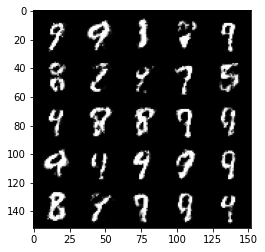

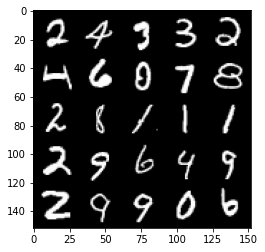

Step 70000: Generator loss: 2.1651463580131507, discriminator loss: 0.2930249183177946


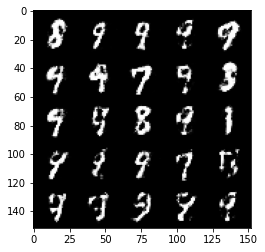

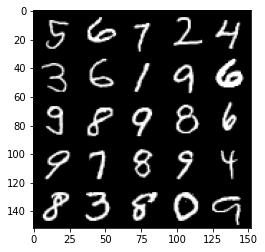

Step 70500: Generator loss: 2.2147112407684353, discriminator loss: 0.2793984408080578


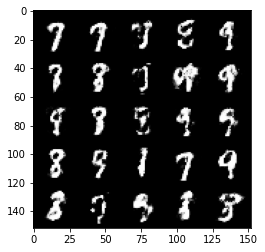

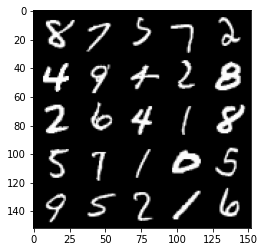

Step 71000: Generator loss: 2.1598788087368024, discriminator loss: 0.2812588218748568


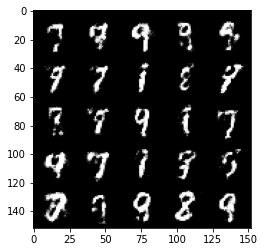

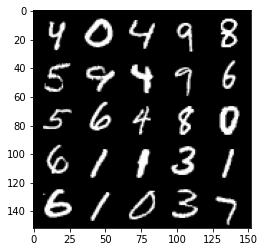

Step 71500: Generator loss: 2.184147638320924, discriminator loss: 0.2719577172696589


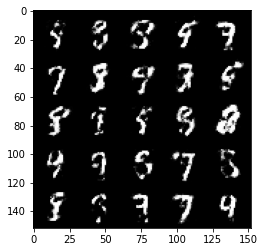

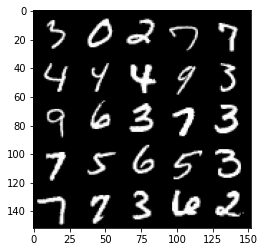

Step 72000: Generator loss: 2.0964214560985592, discriminator loss: 0.2935590093433861


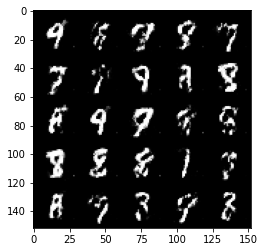

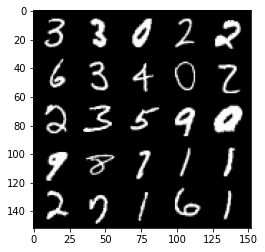

Step 72500: Generator loss: 2.1759149234294917, discriminator loss: 0.2754855144619941


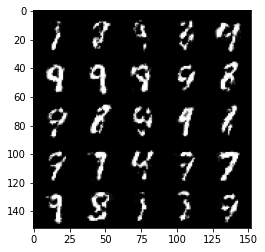

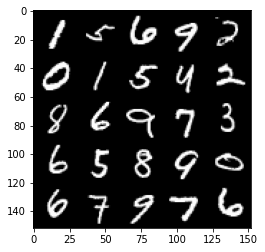

Step 73000: Generator loss: 2.157890951633453, discriminator loss: 0.26933458134531985


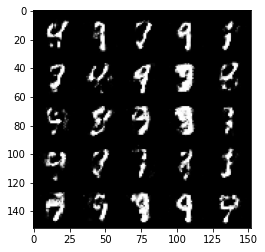

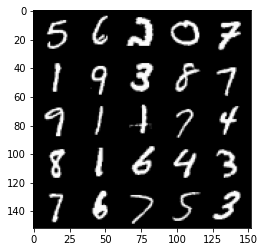

Step 73500: Generator loss: 2.2597453134059906, discriminator loss: 0.25068020492792137


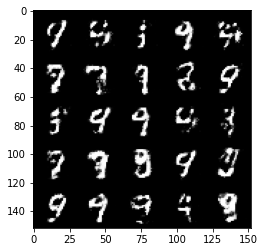

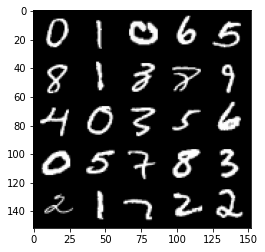

Step 74000: Generator loss: 2.3304319007396677, discriminator loss: 0.24831884187459957


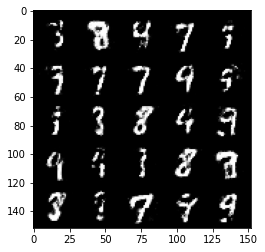

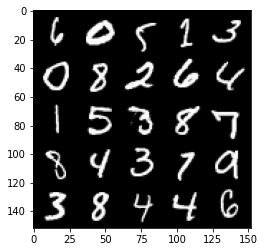

Step 74500: Generator loss: 2.1206442310810103, discriminator loss: 0.28268754747509944


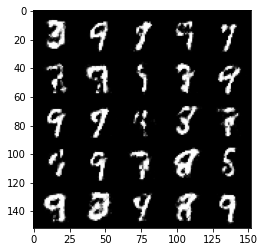

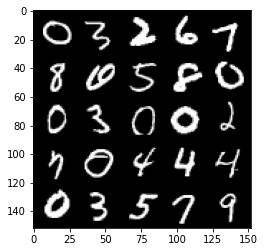

Step 75000: Generator loss: 2.079744762420653, discriminator loss: 0.2952453364729884


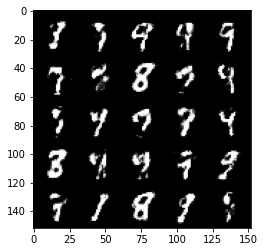

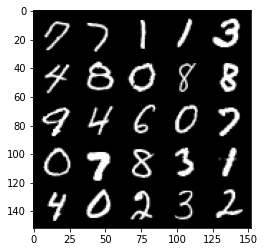

Step 75500: Generator loss: 2.1768310115337393, discriminator loss: 0.2772414202392101


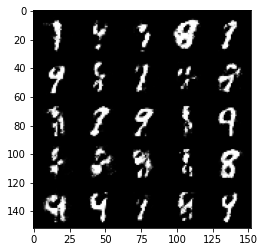

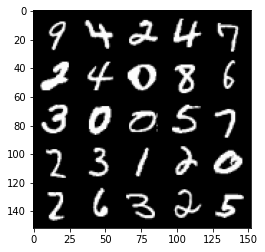

Step 76000: Generator loss: 2.0629613850116737, discriminator loss: 0.29769079709053037


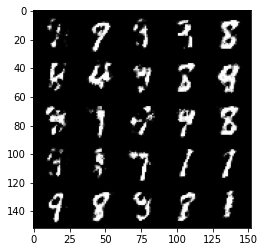

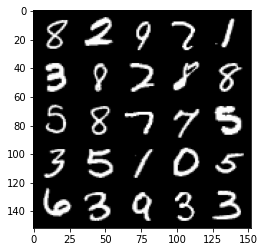

Step 76500: Generator loss: 2.111299258708954, discriminator loss: 0.2816352154910567


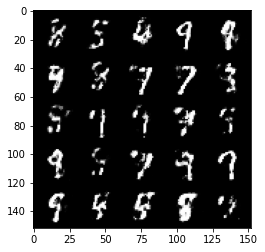

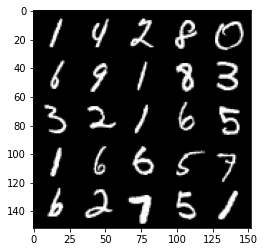

Step 77000: Generator loss: 2.2313863642215765, discriminator loss: 0.2603600358664987


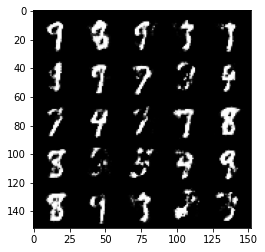

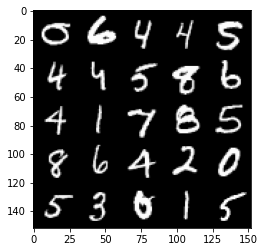

Step 77500: Generator loss: 2.154709894657136, discriminator loss: 0.2789695631563665


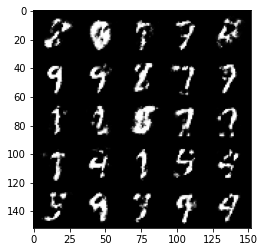

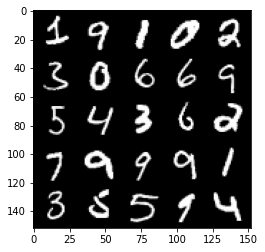

Step 78000: Generator loss: 2.115406845331192, discriminator loss: 0.28992412063479445


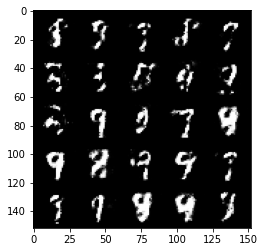

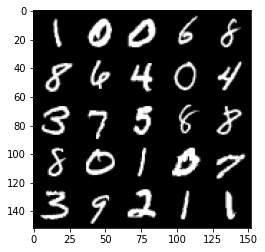

Step 78500: Generator loss: 2.0846096091270447, discriminator loss: 0.29716595852374994


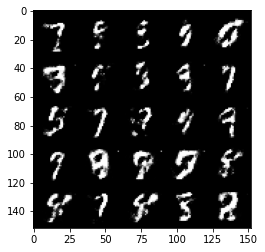

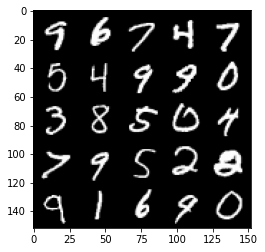

Step 79000: Generator loss: 2.2087724504470825, discriminator loss: 0.27874799638986575


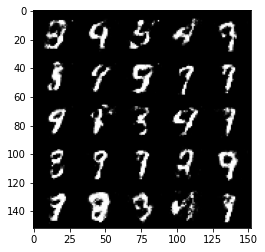

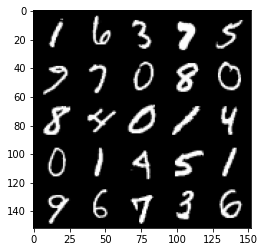

Step 79500: Generator loss: 2.1562423217296574, discriminator loss: 0.29385534948110587


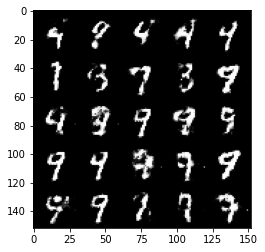

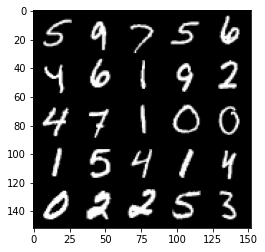

Step 80000: Generator loss: 2.093039006233217, discriminator loss: 0.29601104295253755


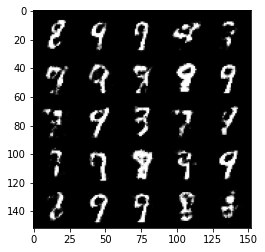

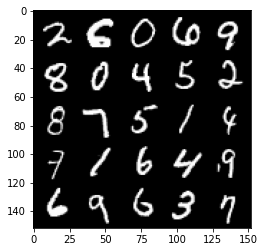

Step 80500: Generator loss: 2.1099083642959604, discriminator loss: 0.30147155317664154


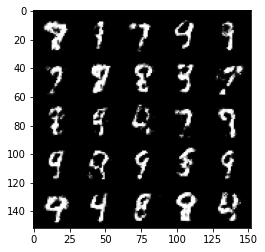

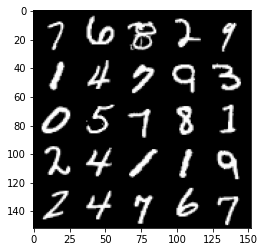

Step 81000: Generator loss: 2.0805772004127494, discriminator loss: 0.3029798711836336


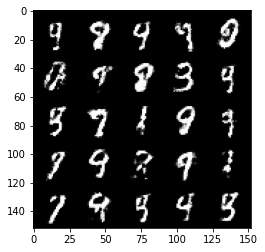

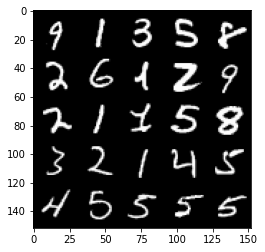

Step 81500: Generator loss: 1.9778916907310493, discriminator loss: 0.3194705883264542


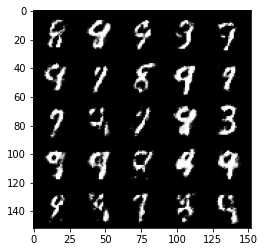

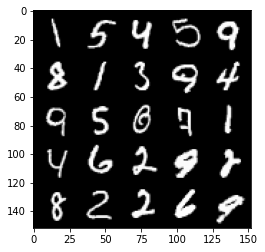

Step 82000: Generator loss: 1.965223019599914, discriminator loss: 0.3189708505570889


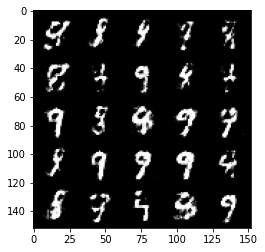

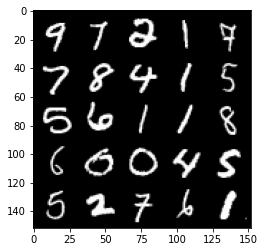

Step 82500: Generator loss: 2.0593258335590354, discriminator loss: 0.2928652382791043


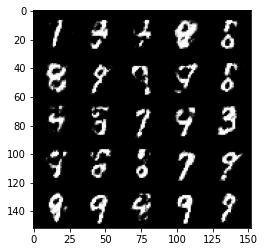

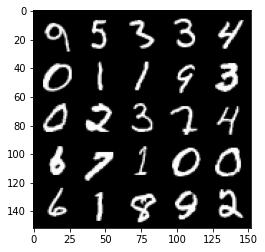

Step 83000: Generator loss: 2.0713984541893016, discriminator loss: 0.29476939374208444


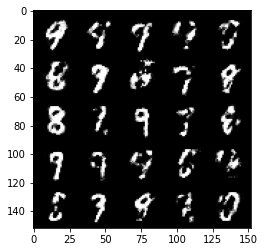

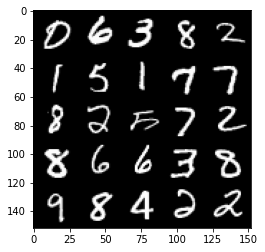

Step 83500: Generator loss: 2.0551388494968403, discriminator loss: 0.28471135196089775


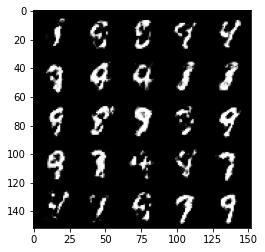

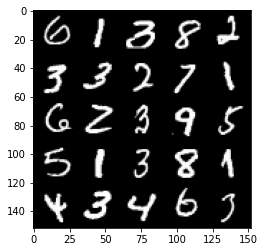

Step 84000: Generator loss: 2.109048086643219, discriminator loss: 0.28820206633210205


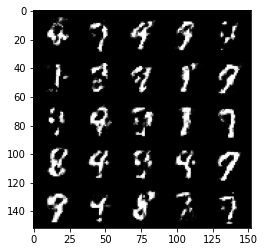

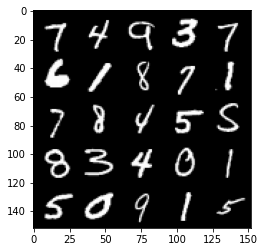

Step 84500: Generator loss: 1.9820189471244807, discriminator loss: 0.3164580573737624


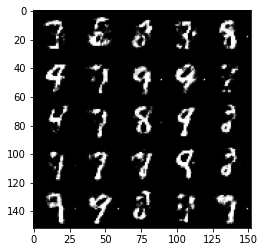

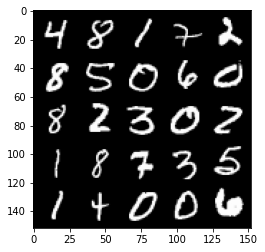

Step 85000: Generator loss: 1.982896919488908, discriminator loss: 0.3152055953443054


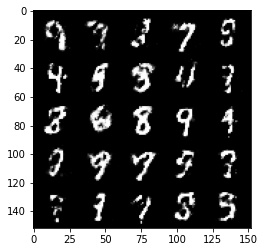

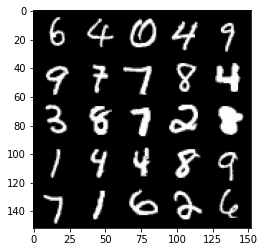

Step 85500: Generator loss: 1.9044425690174112, discriminator loss: 0.32919463819265354


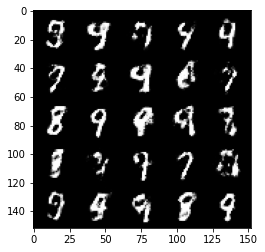

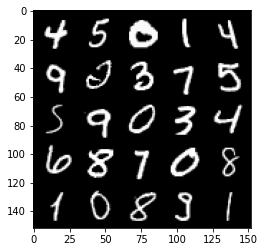

Step 86000: Generator loss: 1.809305044651031, discriminator loss: 0.36152430969476707


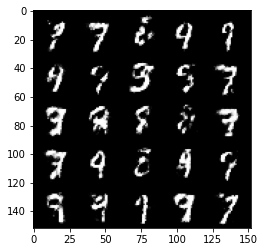

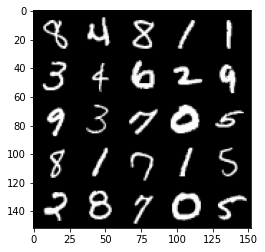

Step 86500: Generator loss: 1.8702803711891192, discriminator loss: 0.3299956180155279


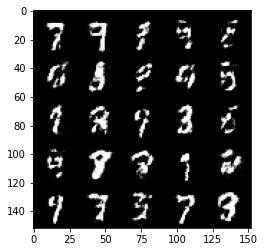

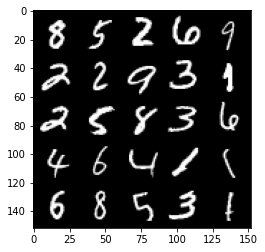

Step 87000: Generator loss: 1.9977548887729646, discriminator loss: 0.30278408661484735


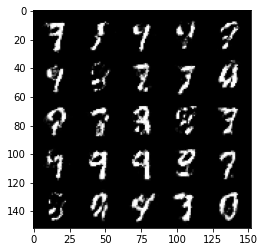

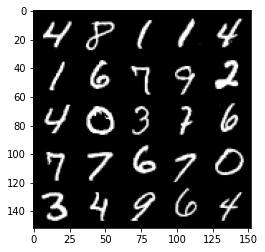

Step 87500: Generator loss: 1.903320393323898, discriminator loss: 0.33230787214636814


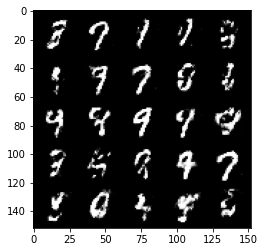

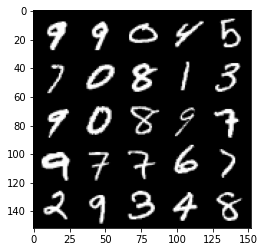

Step 88000: Generator loss: 1.9158821899890912, discriminator loss: 0.32195110195875165


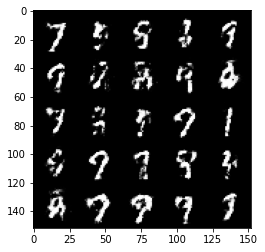

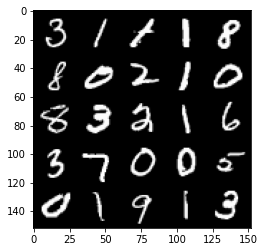

Step 88500: Generator loss: 1.546697790622711, discriminator loss: 0.544060490489006


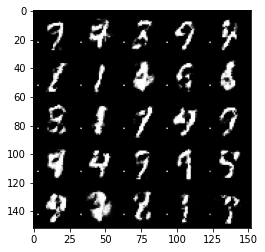

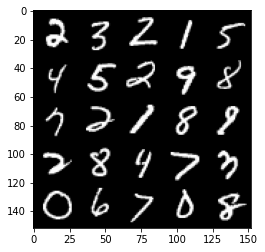

Step 89000: Generator loss: 2.0747400372028326, discriminator loss: 0.2479516905546191


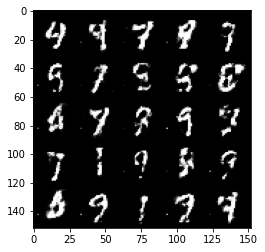

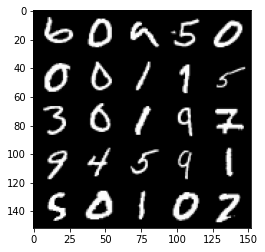

Step 89500: Generator loss: 2.0063941280841844, discriminator loss: 0.31674575218558326


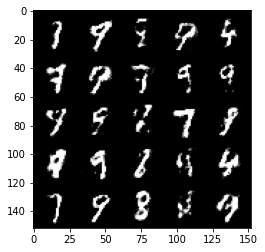

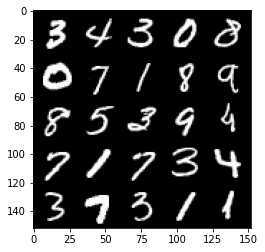

Step 90000: Generator loss: 1.8913942184448245, discriminator loss: 0.32229720985889426


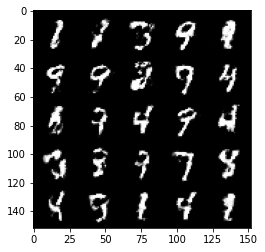

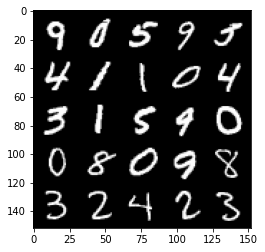

Step 90500: Generator loss: 1.96440986943245, discriminator loss: 0.31128988626599313


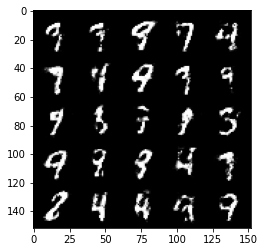

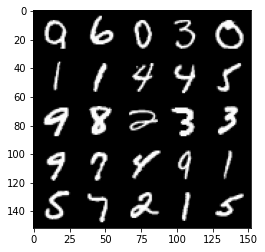

Step 91000: Generator loss: 1.8805733225345607, discriminator loss: 0.332773133456707


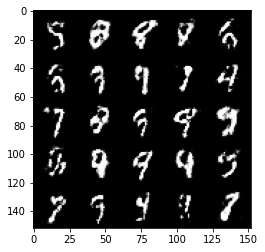

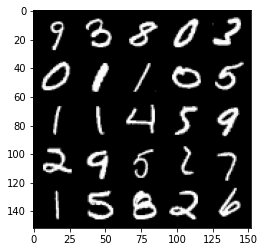

Step 91500: Generator loss: 1.8506226291656491, discriminator loss: 0.3274475487768649


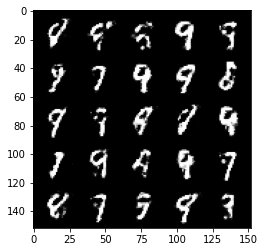

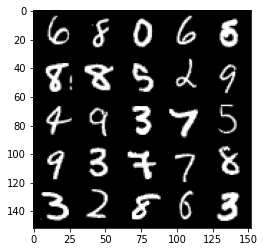

Step 92000: Generator loss: 1.8956377599239338, discriminator loss: 0.33076730176806435


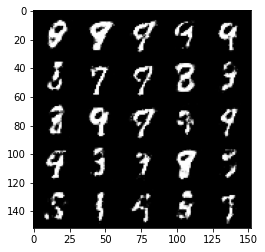

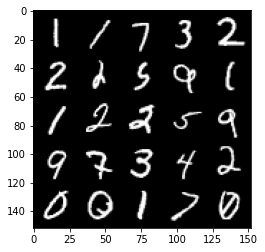

Step 92500: Generator loss: 1.9256114568710356, discriminator loss: 0.3224875696003436


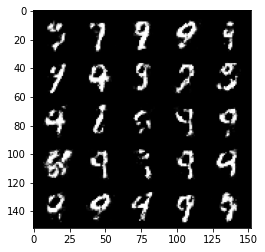

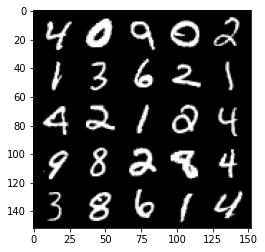

Step 93000: Generator loss: 1.8670365016460424, discriminator loss: 0.33933837246894843


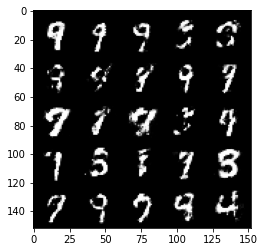

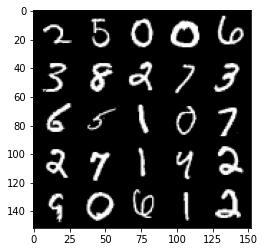

Step 93500: Generator loss: 1.9147098057270053, discriminator loss: 0.31945305883884456


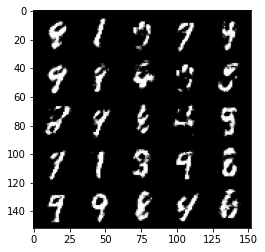

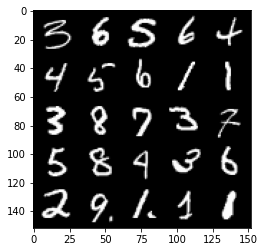

In [19]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**